# Convolutional Neural Network (December 6th, 2024)

## Image classification with MNIST

### Import dependencies and download dataset

In [ ]:
import os
import random
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets

from torchsummary import summary

import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
ROOT='./data'
train_data = datasets.MNIST(root=ROOT,
                            train=True,
                            download = True)
test_data = datasets.MNIST(root=ROOT,
                           train=False,
                           download = True)

In [ ]:
train_data.data.shape, test_data.data.shape

(torch.Size([60000, 28, 28]), torch.Size([10000, 28, 28]))

In [ ]:
train_data.targets.shape, test_data.targets.shape

(torch.Size([60000]), torch.Size([10000]))

In [ ]:
train_data.data[0], train_data.targets[0]

(tensor([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,  18,
           18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,

In [ ]:
train_data.classes

['0 - zero',
 '1 - one',
 '2 - two',
 '3 - three',
 '4 - four',
 '5 - five',
 '6 - six',
 '7 - seven',
 '8 - eight',
 '9 - nine']

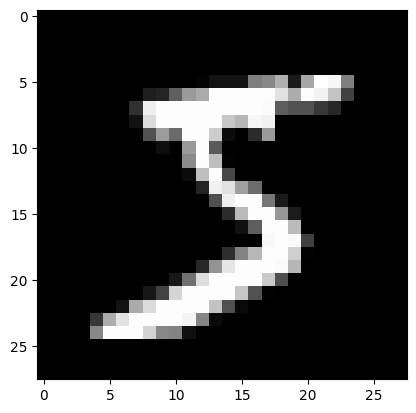

In [ ]:
plt.imshow(train_data.data[0], cmap='gray')

### Preprocess data

In [ ]:
# split training: validation = 0.9: 0.1
VALID_RATIO = 0.9

n_train_examples = int(len(train_data) * VALID_RATIO)
n_valid_examples = len(train_data) - n_train_examples

print(type(train_data))
train_data, valid_data = data.random_split(train_data,
                                           [n_train_examples, n_valid_examples]
                                          )
print(type(train_data))

<class 'torchvision.datasets.mnist.MNIST'>
<class 'torch.utils.data.dataset.Subset'>


In [ ]:
train_data.dataset.transform

In [ ]:
from logging import error
# compute mean and std for normalization
mean = train_data.dataset.data.float().mean() / 255
std = train_data.dataset.data.float().std() / 255

train_transforms = transforms.Compose([transforms.ToTensor(),
                                       transforms.Normalize(mean=[mean], std=[std])])

# Create dataloader
BATCH_SIZE = 256

train_dataloader = data.DataLoader(train_data,
                                   shuffle=True,
                                   batch_size=BATCH_SIZE)
try:
    next(iter(train_dataloader))[0]
except TypeError as err:
    print(err)

default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found <class 'PIL.Image.Image'>


In [ ]:
from logging import error
# compute mean and std for normalization
mean = train_data.dataset.data.float().mean() / 255
std = train_data.dataset.data.float().std() / 255

train_transforms = transforms.Compose([transforms.Normalize(mean=[mean], std=[std])])

# Create dataloader
BATCH_SIZE = 256

train_dataloader = data.DataLoader(train_data,
                                   shuffle=True,
                                   batch_size=BATCH_SIZE)
try:
    next(iter(train_dataloader))[0]
except TypeError as err:
    print(err)

default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found <class 'PIL.Image.Image'>


In [ ]:
# compute mean and std for normalization
mean = train_data.dataset.data.float().mean() / 255
std = train_data.dataset.data.float().std() / 255

train_transforms = transforms.Compose([transforms.ToTensor(),
                                       transforms.Normalize(mean=[mean], std=[std])]
                                      )
test_transforms = transforms.Compose([transforms.ToTensor(),
                                      transforms.Normalize(mean=[mean], std=[std])]
                                     )

train_data.dataset.transform = train_transforms
valid_data.dataset.transform = test_transforms

In [ ]:
# Create dataloader
BATCH_SIZE = 256

train_dataloader = data.DataLoader(train_data,
                                   shuffle=True,
                                   batch_size=BATCH_SIZE)

valid_dataloader = data.DataLoader(valid_data,
                                   batch_size=BATCH_SIZE)

In [ ]:
next(iter(train_dataloader))[0].shape, next(iter(train_dataloader))[1].shape

(torch.Size([256, 1, 28, 28]), torch.Size([256]))

In [ ]:
next(iter(train_dataloader))[0]

tensor([[[[-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          ...,
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241]]],


        [[[-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          ...,
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241]]],


        [[[-0.4241, -0.4241, -0.4241,  ..., -0.4241, -0.4241, -0.4241],
          [-0.4241, -0.424

### Implement LeNet model

In [ ]:
class LeNetClassifier(nn.Module):
  def __init__ (self, num_classes):
    super().__init__ ()
    self.conv1 = nn.Conv2d(in_channels=1,
                           out_channels=6,
                           kernel_size=5,
                           padding='same')
    self.avgpool1 = nn.AvgPool2d(kernel_size=2)
    self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)
    self.avgpool2 = nn.AvgPool2d(kernel_size=2)
    self.flatten = nn.Flatten()
    self.fc_1 = nn.Linear(16 * 5 * 5, 120)
    self.fc_2 = nn.Linear(120, 84)
    self.fc_3 = nn.Linear(84, num_classes)

  def forward(self, inputs):
    outputs = self.conv1 (inputs)
    outputs = self.avgpool1 (outputs)
    outputs = F.relu(outputs)
    outputs = self.conv2 (outputs)
    outputs = self.avgpool2 (outputs)
    outputs = F.relu(outputs)
    outputs = self.flatten(outputs)
    outputs = self.fc_1 (outputs)
    outputs = self.fc_2 (outputs)
    outputs = self.fc_3 (outputs)
    return outputs

In [ ]:
num_classes = len(train_data.dataset.classes)
num_classes

10

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
lenet_model = LeNetClassifier(num_classes).to(device)
lenet_model

LeNetClassifier(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (avgpool1): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (avgpool2): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc_1): Linear(in_features=400, out_features=120, bias=True)
  (fc_2): Linear(in_features=120, out_features=84, bias=True)
  (fc_3): Linear(in_features=84, out_features=10, bias=True)
)

In [ ]:
summary(lenet_model, (1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 28, 28]             156
         AvgPool2d-2            [-1, 6, 14, 14]               0
            Conv2d-3           [-1, 16, 10, 10]           2,416
         AvgPool2d-4             [-1, 16, 5, 5]               0
           Flatten-5                  [-1, 400]               0
            Linear-6                  [-1, 120]          48,120
            Linear-7                   [-1, 84]          10,164
            Linear-8                   [-1, 10]             850
Total params: 61,706
Trainable params: 61,706
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.06
Params size (MB): 0.24
Estimated Total Size (MB): 0.30
----------------------------------------------------------------


### Train and Evaluate

In [ ]:
import time

def train(model, optimizer, criterion, train_dataloader, device, epoch=0, log_interval=50):
    model.train()
    total_acc, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()
        total_acc += (predictions.argmax(1) == labels).sum().item()
        total_count += labels.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| accuracy {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_acc / total_count
                )
            )
            total_acc, total_count = 0, 0
            start_time = time.time()

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
def evaluate(model, criterion, valid_dataloader, device):
    model.eval()
    total_acc, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())

            total_acc += (predictions.argmax(1) == labels).sum().item()
            total_count += labels.size(0)

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
optimizer = optim.Adam(lenet_model.parameters())
criterion = nn.CrossEntropyLoss()

In [ ]:
train_acc, train_loss = train(lenet_model, optimizer, criterion, train_dataloader, device)

| epoch   0 |    50/  211 batches | accuracy    0.648
| epoch   0 |   100/  211 batches | accuracy    0.869
| epoch   0 |   150/  211 batches | accuracy    0.896
| epoch   0 |   200/  211 batches | accuracy    0.924


In [ ]:
train_acc, train_loss

(0.940251572327044, 0.526336361587895)

In [ ]:
eval_acc, eval_loss = evaluate(lenet_model, criterion, valid_dataloader, device)

In [ ]:
eval_acc, eval_loss

(0.938, 0.2048026950409015)

In [ ]:
!mkdir -p model

In [ ]:
num_epochs = 10
save_model = './model'

train_accs, train_losses = [], []
eval_accs, eval_losses = [], []
best_loss_eval = 100

for epoch in range(1, num_epochs+1):
    epoch_start_time = time.time()
    # Training
    train_acc, train_loss = train(lenet_model, optimizer, criterion, train_dataloader, device, epoch)
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    # Evaluation
    eval_acc, eval_loss = evaluate(lenet_model, criterion, valid_dataloader, device)
    eval_accs.append(eval_acc)
    eval_losses.append(eval_loss)

    # Save best model
    if eval_loss < best_loss_eval:
        torch.save(lenet_model.state_dict(), save_model + '/lenet_model.pt')
        best_loss_eval = eval_loss

    # Print loss, acc end epoch
    print("-" * 59)
    print(
        "| End of epoch {:3d} | Time: {:5.2f}s | Train Accuracy {:8.3f} | Train Loss {:8.3f} "
        "| Valid Accuracy {:8.3f} | Valid Loss {:8.3f} ".format(
            epoch, time.time() - epoch_start_time, train_acc, train_loss, eval_acc, eval_loss
        )
    )
    print("-" * 59)

    # Load best model
    lenet_model.load_state_dict(torch.load(save_model + '/lenet_model.pt', weights_only=True))
    lenet_model.eval()

| epoch   1 |    50/  211 batches | accuracy    0.968
| epoch   1 |   100/  211 batches | accuracy    0.969
| epoch   1 |   150/  211 batches | accuracy    0.973
| epoch   1 |   200/  211 batches | accuracy    0.971
-----------------------------------------------------------
| End of epoch   1 | Time: 13.22s | Train Accuracy    0.972 | Train Loss    0.096 | Valid Accuracy    0.967 | Valid Loss    0.102 
-----------------------------------------------------------
| epoch   2 |    50/  211 batches | accuracy    0.974
| epoch   2 |   100/  211 batches | accuracy    0.977
| epoch   2 |   150/  211 batches | accuracy    0.977
| epoch   2 |   200/  211 batches | accuracy    0.978
-----------------------------------------------------------
| End of epoch   2 | Time: 13.26s | Train Accuracy    0.974 | Train Loss    0.077 | Valid Accuracy    0.973 | Valid Loss    0.082 
-----------------------------------------------------------
| epoch   3 |    50/  211 batches | accuracy    0.977
| epoch   3 

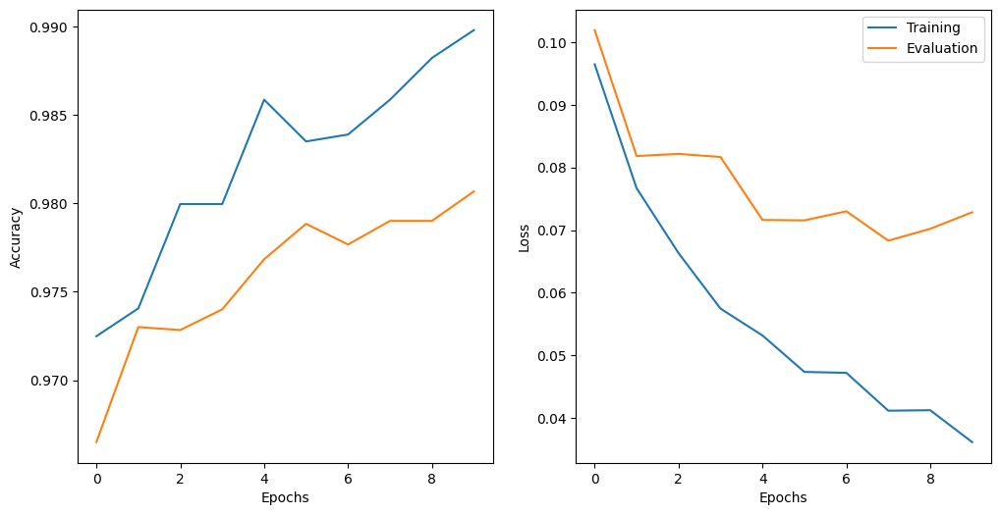

In [ ]:
def plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_accs, label = "Training")
    axs[0].plot(epochs, eval_accs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("Accuracy")
    axs[1].set_ylabel("Loss")
    plt.legend()

plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses)

### Test

In [ ]:
test_data.transform = test_transforms
test_dataloader = data.DataLoader(test_data,
                                  batch_size=BATCH_SIZE)
test_acc, test_loss = evaluate(lenet_model,
                               criterion,
                               test_dataloader,
                               device)
test_acc, test_loss

(0.9838, 0.04976240329851862)

In [ ]:
def plot_filtered_images(images, filters):

    images = torch.cat([i.unsqueeze(0) for i in images], dim=0).cpu()
    filters = filters.cpu()

    n_images = images.shape[0]
    n_filters = filters.shape[0]

    filtered_images = F.conv2d(images, filters)

    fig = plt.figure(figsize=(20, 10))

    for i in range(n_images):

        ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters))
        ax.imshow(images[i].squeeze(0), cmap='bone')
        ax.set_title('Original')
        ax.axis('off')

        for j in range(n_filters):
            image = filtered_images[i][j]
            ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters)+j+1)
            ax.imshow(image.numpy(), cmap='bone')
            ax.set_title(f'Filter {j+1}')
            ax.axis('off')

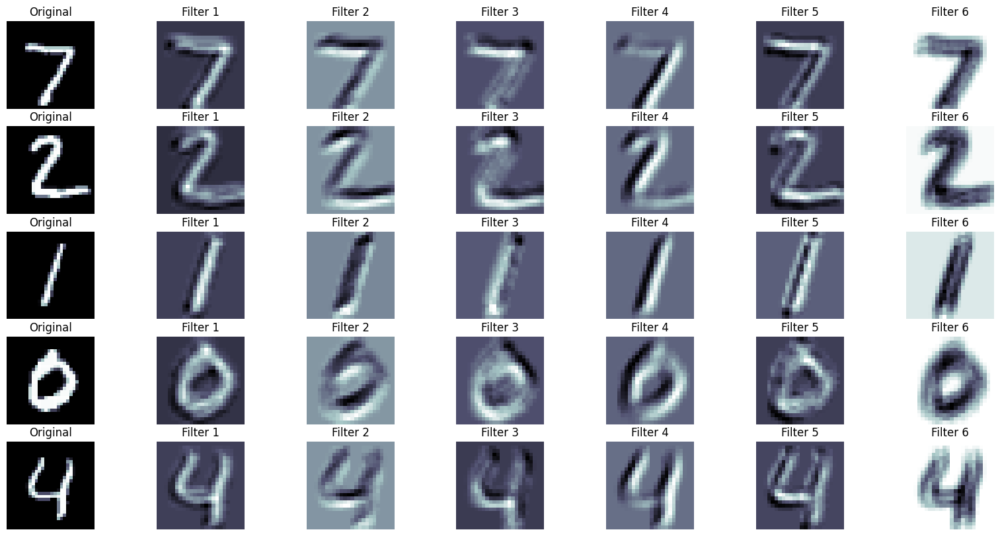

In [ ]:
N_IMAGES = 5

images = [image for image, label in [test_data[i] for i in range(N_IMAGES)]]
filters = lenet_model.conv1.weight.data

plot_filtered_images(images, filters)

## Image classification for Cassava Leaf Disease

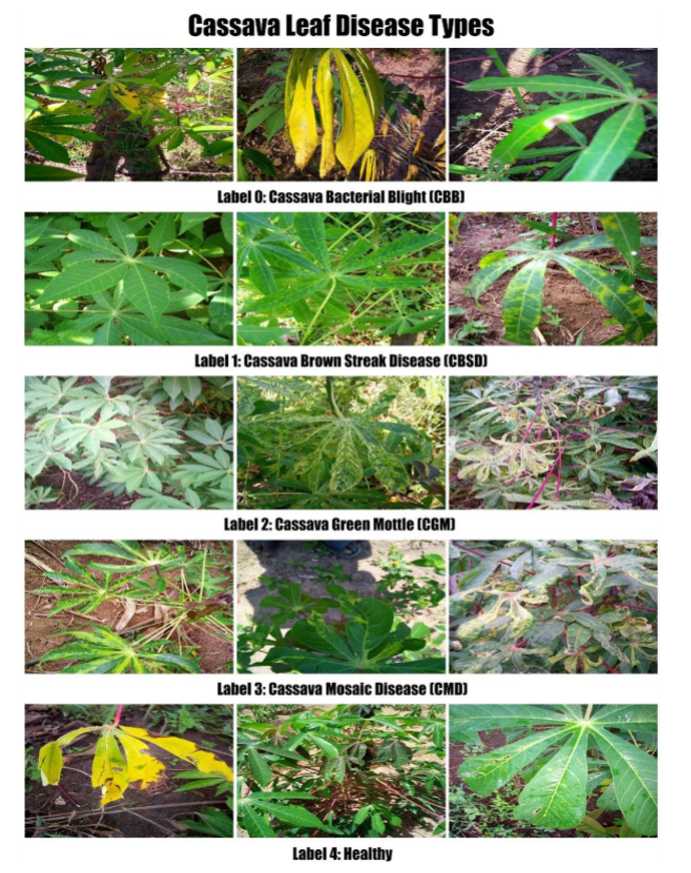

### Import dependencies and Download dataset

In [ ]:
!wget --no-check-certificate https://storage.googleapis.com/emcassavadata/cassavaleafdata.zip \
                -O /content/cassavaleafdata.zip

--2024-12-08 20:52:07--  https://storage.googleapis.com/emcassavadata/cassavaleafdata.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.10.207, 142.251.12.207, 172.217.194.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.10.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1354096203 (1.3G) [application/octet-stream]
Saving to: ‘/content/cassavaleafdata.zip’

/content/cassavalea 100%[===================>]   1.26G  22.9MB/s    in 57s     

2024-12-08 20:53:05 (22.7 MB/s) - ‘/content/cassavaleafdata.zip’ saved [1354096203/1354096203]



In [ ]:
!unzip /content/cassavaleafdata.zip

Streaming output truncated to the last 5000 lines.
  inflating: cassavaleafdata/train/cgm/train-cgm-679.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-68.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-680.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-681.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-682.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-683.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-684.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-685.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-686.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-687.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-688.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-689.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-69.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-690.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-691.jpg  
  inflating: cassavaleafdata/train/cgm/train-cgm-692.jpg  
  infla

In [ ]:
%cd /content/cassavaleafdata

/content/cassavaleafdata


In [ ]:
data_paths = {
    'train': './train',
    'valid': './validation',
    'test': './test'
}

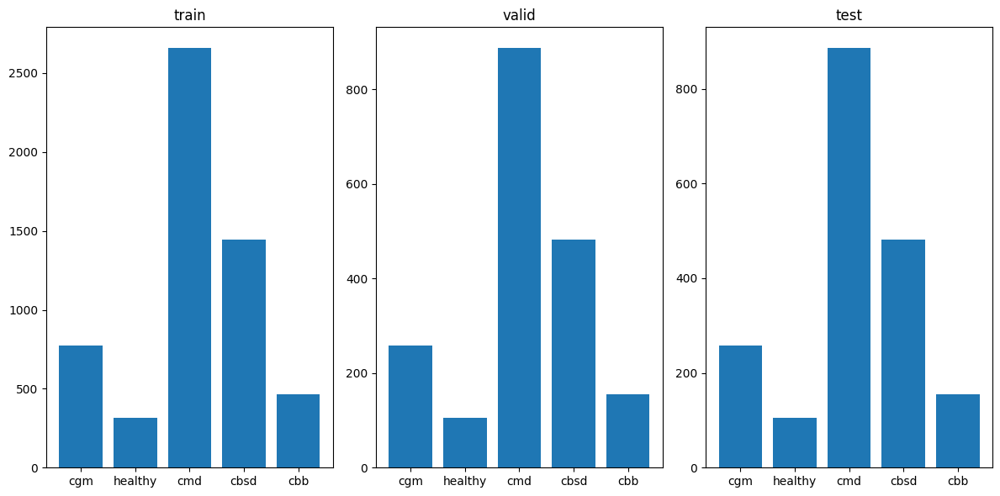

In [ ]:
from imutils import paths

def show_labels(data_paths):
    fig, ax = plt.subplots(1, len(data_paths), figsize=(12,6))
    for idx, (key, sub_dir) in enumerate(data_paths.items()):
        labels = os.listdir(sub_dir)
        list_data = []
        for label in labels:
            image_files = list(paths.list_images(os.path.join(sub_dir, label)))
            list_data.append(len(image_files))
        ax[idx].bar(labels, list_data)
        ax[idx].set_title(key)
    plt.tight_layout()
    plt.show()

show_labels(data_paths)

In [ ]:
labels_dict = {
    "cbb": "Cassava Bacterial Blight (CBB)",
    "cbsd": "Cassava Brown Streak Disease (CBSD)",
    "cgm": "Cassava Green Mottle (CGM)",
    "cmd": "Cassava Mosaic Disease (CMD)",
    "healthy": "Healthy"
}

In [ ]:
def plot_images(data_dir, label, num_sample=6):
    data_dir = os.path.join(data_dir, label)
    image_files = list(paths.list_images(data_dir))[:num_sample]
    fig, ax = plt.subplots(2, num_sample//2, figsize=(14,7))
    for i, image_dir in enumerate(image_files):
        img = Image.open(image_dir)
        label = image_dir.split('/')[-2]
        ax[i//(num_sample//2)][i%(num_sample//2)].imshow(img)
        ax[i//(num_sample//2)][i%(num_sample//2)].set_title(labels_dict[label])
        ax[i//(num_sample//2)][i%(num_sample//2)].axis('off')
    plt.tight_layout()
    plt.show()

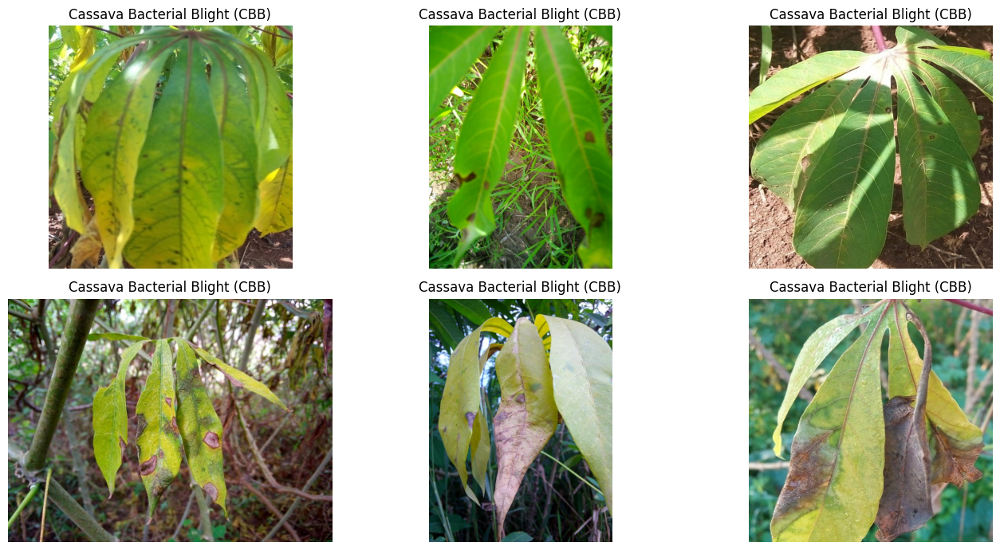

In [ ]:
plot_images(data_paths['train'], label="cbb")

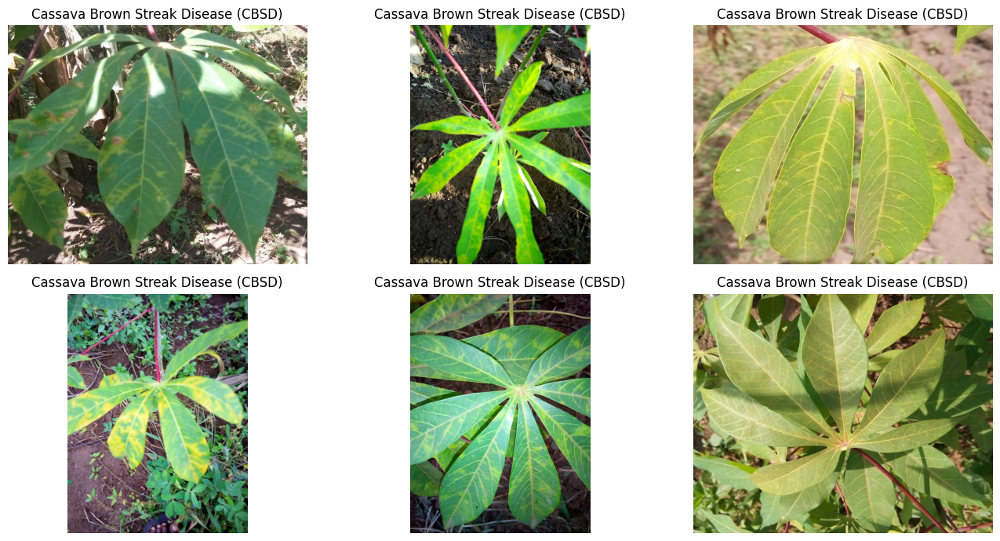

In [ ]:
plot_images(data_paths['train'], label="cbsd")

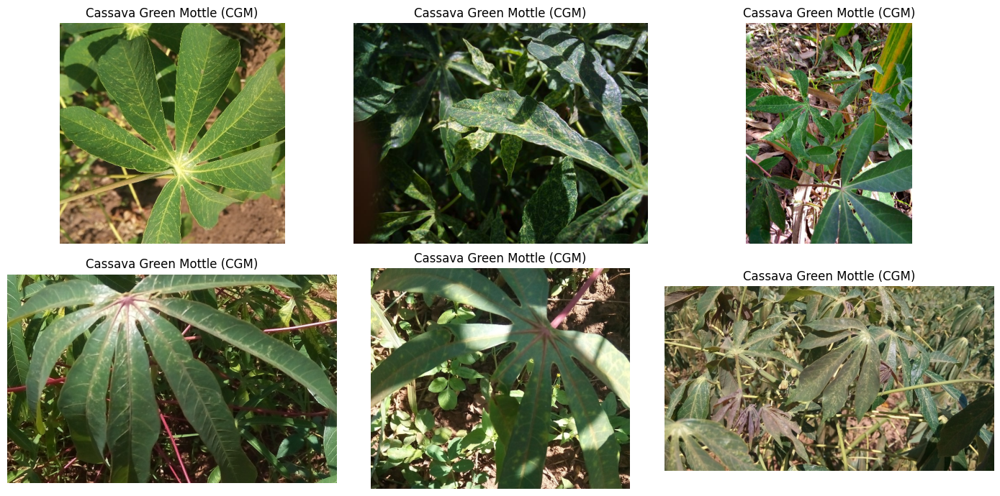

In [ ]:
plot_images(data_paths['train'], label="cgm")

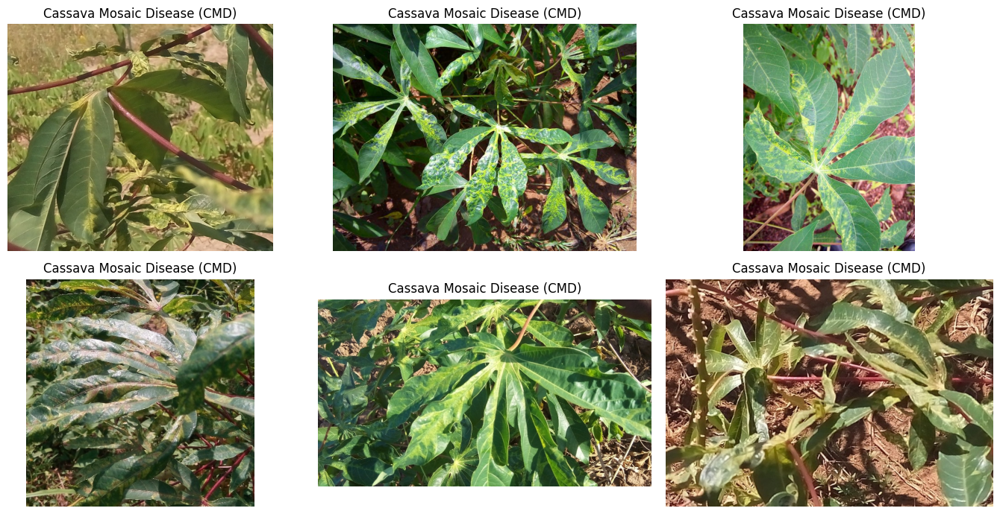

In [ ]:
plot_images(data_paths['train'], label="cmd")

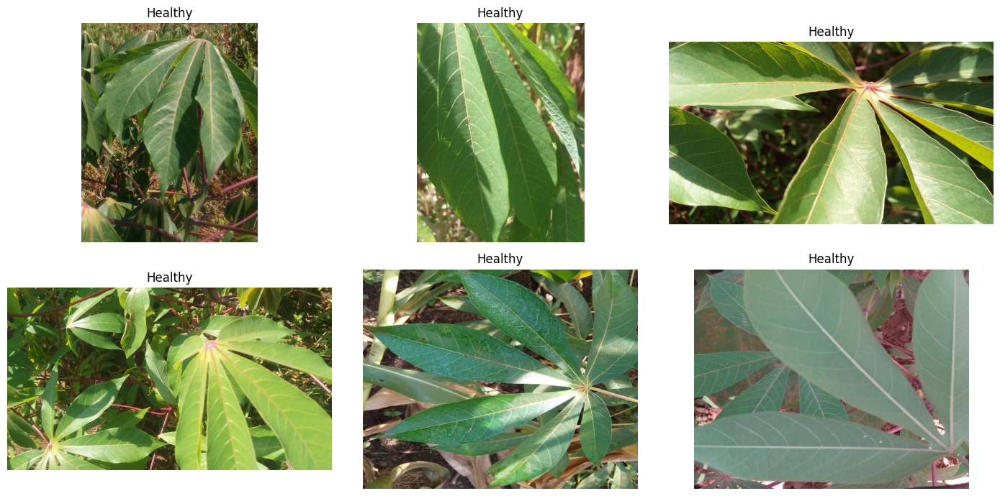

In [ ]:
plot_images(data_paths['train'], label="healthy")

### Preprocessing

In [ ]:
# load image from path
def loader(path):
    return Image.open(path)

In [ ]:
img_size = 150

train_transforms = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
])

In [ ]:
train_data = datasets.ImageFolder(
    root=data_paths['train'],
    loader=loader,
    transform=train_transforms
)
valid_data = datasets.ImageFolder(
    root=data_paths['valid'],
    transform=train_transforms
)
test_data = datasets.ImageFolder(
    root=data_paths['test'],
    transform=train_transforms
)

### Dataloader

In [ ]:
BATCH_SIZE = 512

train_dataloader = data.DataLoader(
    train_data,
    shuffle=True,
    batch_size=BATCH_SIZE
)
valid_dataloader = data.DataLoader(
    valid_data,
    batch_size=BATCH_SIZE
)
test_dataloader = data.DataLoader(
    test_data,
    batch_size=BATCH_SIZE
)

In [ ]:
len(train_dataloader)

12

### Model

In [ ]:
class LeNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.conv1 = nn.Conv2d(
            in_channels=3, out_channels=6, kernel_size=5, padding='same'
        )
        self.avgpool1 = nn.AvgPool2d(kernel_size=2)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)
        self.avgpool2 = nn.AvgPool2d(kernel_size=2)
        self.flatten = nn.Flatten()
        self.fc_1 = nn.Linear(16 * 35 * 35, 120)
        self.fc_2 = nn.Linear(120, 84)
        self.fc_3 = nn.Linear(84, num_classes)

    def forward(self, inputs):
        outputs = self.conv1(inputs)
        outputs = self.avgpool1(outputs)
        outputs = F.relu(outputs)
        outputs = self.conv2(outputs)
        outputs = self.avgpool2(outputs)
        outputs = F.relu(outputs)
        outputs = self.flatten(outputs)
        outputs = self.fc_1(outputs)
        outputs = self.fc_2(outputs)
        outputs = self.fc_3(outputs)
        return outputs

In [ ]:
num_classes = len(train_data.classes)
num_classes

5

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
lenet_model = LeNetClassifier(num_classes).to(device)

In [ ]:
summary(lenet_model, (3, 150, 150))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 6, 150, 150]             456
         AvgPool2d-2            [-1, 6, 75, 75]               0
            Conv2d-3           [-1, 16, 71, 71]           2,416
         AvgPool2d-4           [-1, 16, 35, 35]               0
           Flatten-5                [-1, 19600]               0
            Linear-6                  [-1, 120]       2,352,120
            Linear-7                   [-1, 84]          10,164
            Linear-8                    [-1, 5]             425
Total params: 2,365,581
Trainable params: 2,365,581
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.26
Forward/backward pass size (MB): 2.20
Params size (MB): 9.02
Estimated Total Size (MB): 11.48
----------------------------------------------------------------


### Loss & Optimizer

In [ ]:
optimizer = optim.Adam(lenet_model.parameters())

In [ ]:
criterion = nn.CrossEntropyLoss()

### Train and Evaluate

In [ ]:
import time

def train(model, optimizer, criterion, train_dataloader, device, epoch=0, log_interval=15):
    model.train()
    total_acc, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()
        total_acc += (predictions.argmax(1) == labels).sum().item()
        total_count += labels.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| accuracy {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_acc / total_count
                )
            )
            total_acc, total_count = 0, 0
            start_time = time.time()

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
train_acc, train_loss = train(lenet_model, optimizer, criterion, train_dataloader, device)

In [ ]:
train_acc, train_loss

(0.4296322489391796, 1.4081460734208424)

In [ ]:
def evaluate(model, criterion, valid_dataloader, device):
    model.eval()
    total_acc, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())

            total_acc += (predictions.argmax(1) == labels).sum().item()
            total_count += labels.size(0)

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
eval_acc, eval_loss = evaluate(lenet_model, criterion, valid_dataloader, device)

In [ ]:
eval_acc, eval_loss

(0.4695606140815246, 1.344612941145897)

In [ ]:
!mkdir -p model

In [ ]:
num_classes = len(train_data.classes)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

lenet_model = LeNetClassifier(num_classes)
lenet_model.to(device)

criterion = torch.nn.CrossEntropyLoss()
learning_rate = 2e-4
optimizer = optim.Adam(lenet_model.parameters(), learning_rate)

num_epochs = 10
save_model = './model'

train_accs, train_losses = [], []
eval_accs, eval_losses = [], []
best_loss_eval = 100

for epoch in range(1, num_epochs+1):
    epoch_start_time = time.time()
    # Training
    train_acc, train_loss = train(lenet_model, optimizer, criterion, train_dataloader, device, epoch, log_interval=10)
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    # Evaluation
    eval_acc, eval_loss = evaluate(lenet_model, criterion, valid_dataloader, device)
    eval_accs.append(eval_acc)
    eval_losses.append(eval_loss)

    # Save best model
    if eval_loss < best_loss_eval:
        torch.save(lenet_model.state_dict(), save_model + '/lenet_model.pt')
        best_loss_eval = eval_loss

    # Print loss, acc end epoch
    print("-" * 59)
    print(
        "| End of epoch {:3d} | Time: {:5.2f}s | Train Accuracy {:8.3f} | Train Loss {:8.3f} "
        "| Valid Accuracy {:8.3f} | Valid Loss {:8.3f} ".format(
            epoch, time.time() - epoch_start_time, train_acc, train_loss, eval_acc, eval_loss
        )
    )
    print("-" * 59)

    # Load best model
    lenet_model.load_state_dict(torch.load(save_model + '/lenet_model.pt', weights_only=True))
    lenet_model.eval()

| epoch   1 |    10/   12 batches | accuracy    0.438
-----------------------------------------------------------
| End of epoch   1 | Time: 42.15s | Train Accuracy    0.375 | Train Loss    1.436 | Valid Accuracy    0.470 | Valid Loss    1.373 
-----------------------------------------------------------
| epoch   2 |    10/   12 batches | accuracy    0.470
-----------------------------------------------------------
| End of epoch   2 | Time: 42.05s | Train Accuracy    0.458 | Train Loss    1.354 | Valid Accuracy    0.470 | Valid Loss    1.338 
-----------------------------------------------------------
| epoch   3 |    10/   12 batches | accuracy    0.470
-----------------------------------------------------------
| End of epoch   3 | Time: 42.02s | Train Accuracy    0.375 | Train Loss    1.350 | Valid Accuracy    0.470 | Valid Loss    1.332 
-----------------------------------------------------------
| epoch   4 |    10/   12 batches | accuracy    0.470
-------------------------------

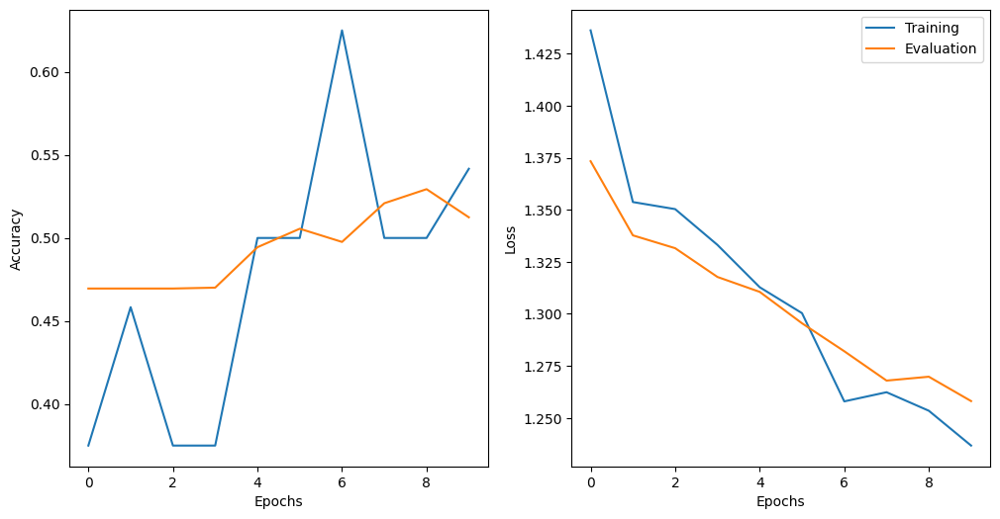

In [ ]:
def plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_accs, label = "Training")
    axs[0].plot(epochs, eval_accs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("Accuracy")
    axs[1].set_ylabel("Loss")
    plt.legend()

plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses)

### Test

In [ ]:
test_acc, test_loss = evaluate(lenet_model, criterion, test_dataloader, device)
test_acc, test_loss

(0.5092838196286472, 1.247128613293171)

In [ ]:
def load_model(model_path, num_classes=5):
    lenet_model = LeNetClassifier(num_classes)
    lenet_model.load_state_dict(torch.load(model_path, weights_only=True))
    lenet_model.eval()
    return lenet_model

def inference(img_path, model):
    image = Image.open(img_path)
    img_size = 150

    img_transform = transforms.Compose([
        transforms.Resize((150, 150)),
        transforms.ToTensor(),
    ])
    img_new = img_transform(image)
    img_new = torch.unsqueeze(img_new, 0)
    with torch.no_grad():
        predictions = model(img_new)
    preds = nn.Softmax(dim=1)(predictions)
    p_max, yhat = torch.max(preds.data, 1)
    return p_max.item(), yhat.item()

In [ ]:
model = load_model('./model/lenet_model.pt')
preds = inference('/content/cassavaleafdata/test/cbsd/test-cbsd-1.jpg', model)
preds

(0.580700159072876, 3)

In [ ]:
# Default attribute, classes are sorted alphabetically
train_data.class_to_idx

{'cbb': 0, 'cbsd': 1, 'cgm': 2, 'cmd': 3, 'healthy': 4}

In [ ]:
idx2label = {v: k for k, v in train_data.class_to_idx.items()}
idx2label

{0: 'cbb', 1: 'cbsd', 2: 'cgm', 3: 'cmd', 4: 'healthy'}

In [ ]:
idx2label[preds[1]]

'cmd'

## Text classification with NTC-SCV dataset

### Import dependencies and Load datasets

In [ ]:
!git clone https://github.com/congnghia0609/ntc-scv.git
!unzip ./ntc-scv/data/data_test.zip -d ./data
!unzip ./ntc-scv/data/data_train.zip -d ./data
!rm -rf ./ntc-scv

Streaming output truncated to the last 5000 lines.
  inflating: ./data/data_train/train/pos/31228.txt  
  inflating: ./data/data_train/train/pos/3123.txt  
  inflating: ./data/data_train/train/pos/31232.txt  
  inflating: ./data/data_train/train/pos/31233.txt  
  inflating: ./data/data_train/train/pos/31234.txt  
  inflating: ./data/data_train/train/pos/31236.txt  
  inflating: ./data/data_train/train/pos/31238.txt  
  inflating: ./data/data_train/train/pos/31240.txt  
  inflating: ./data/data_train/train/pos/31242.txt  
  inflating: ./data/data_train/train/pos/31247.txt  
  inflating: ./data/data_train/train/pos/31250.txt  
  inflating: ./data/data_train/train/pos/31251.txt  
  inflating: ./data/data_train/train/pos/31252.txt  
  inflating: ./data/data_train/train/pos/31257.txt  
  inflating: ./data/data_train/train/pos/31260.txt  
  inflating: ./data/data_train/train/pos/31261.txt  
  inflating: ./data/data_train/train/pos/31262.txt  
  inflating: ./data/data_train/train/pos/31273.tx

In [ ]:
import os
import pandas as pd

def load_data_from_path(folder_path):
    examples = []
    for label in os.listdir(folder_path):
        full_path = os.path.join(folder_path, label)
        for file_name in os.listdir(full_path):
            file_path = os.path.join(full_path, file_name)
            with open(file_path, "r", encoding="utf-8") as f:
                lines = f.readlines()
            sentence = " ".join(lines)
            if label == "neg":
                label = 0
            if label == "pos":
                label = 1
            data = {
                'sentence': sentence,
                'label': label
            }
            examples.append(data)
    return pd.DataFrame(examples)

In [ ]:
folder_paths = {
    'train': './data/data_train/train',
    'valid': './data/data_train/test',
    'test': './data/data_test/test'
}

train_df = load_data_from_path(folder_paths['train'])
valid_df = load_data_from_path(folder_paths['valid'])
test_df = load_data_from_path(folder_paths['test'])

In [ ]:
train_df.head()

,sentence,label
0,Đi 2 lần r lần đầu kím đường muốn chết tới nơi...,0
1,"Ở gần nhà nên cũng ghé qua ăn 2,3 lần . Quán c...",0
2,"Ta ̀ u hu ̉ cư ̣ c dơ ̉ , nha ̣ t nhe ̃ o lă ́...",0
3,Đô ̀ ăn k qua ́ dơ ̉ nhưng cu ̃ ng chưa ngon :...,0
4,Được bạn_bè giới_thiệu về phong_cách trang_trí...,0


In [ ]:
train_df.label.value_counts()

,count
label,
0,15000
1,15000


### Preprocess the dataset

In [ ]:
!pip install langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941171 sha256=f9174380a1a94d1451e306bc1f93848df543480ecf09e95b5e7b0763eec5c1e0
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


#### Distinguish between Vietnamese and other languages

In [ ]:
from langid.langid import LanguageIdentifier, model

def identify_vn(df):
    identifier = LanguageIdentifier.from_modelstring(model, norm_probs=True)
    not_vi_idx = set()
    THRESHOLD = 0.9
    for idx, row in df.iterrows():
        score = identifier.classify(row["sentence"])
        if score[0] != "vi" or (score[0] == "vi" and score[1] <= THRESHOLD):
            not_vi_idx.add(idx)
    vi_df = df[~df.index.isin(not_vi_idx)]
    not_vi_df = df[df.index.isin(not_vi_idx)]
    return vi_df, not_vi_df

In [ ]:
train_df_vi, train_df_other = identify_vn(train_df)

#### Sanitize text

In [ ]:
import re
import string

def preprocess_text(text):
    # remove URLs https://www.
    url_pattern = re.compile(r'https?://\s+\wwww\.\s+')
    text = url_pattern.sub(r" ", text)

    # remove HTML Tags: <>
    html_pattern = re.compile(r'<[^<>]+>')
    text = html_pattern.sub(" ", text)

    # remove puncs and digits
    replace_chars = list(string.punctuation + string.digits)
    for char in replace_chars:
        text = text.replace(char, " ")

    # remove emoji
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U0001F1F2-\U0001F1F4"  # Macau flag
        u"\U0001F1E6-\U0001F1FF"  # flags
        u"\U0001F600-\U0001F64F"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U0001F1F2"
        u"\U0001F1F4"
        u"\U0001F620"
        u"\u200d"
        u"\u2640-\u2642"
        "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r" ", text)

    # normalize whitespace
    text = " ".join(text.split())

    # lowercasing
    text = text.lower()
    return text

In [ ]:
train_df_vi.loc[:, 'preprocess_sentence'] = train_df_vi['sentence'].apply(preprocess_text)
valid_df.loc[:, 'preprocess_sentence'] = valid_df['sentence'].apply(preprocess_text)
test_df.loc[:, 'preprocess_sentence'] = test_df['sentence'].apply(preprocess_text)

<ipython-input-10-27e6caaaacef>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df_vi.loc[:, 'preprocess_sentence'] = train_df_vi['sentence'].apply(preprocess_text)


In [ ]:
train_df_vi

,sentence,label,preprocess_sentence
0,Đi 2 lần r lần đầu kím đường muốn chết tới nơi...,0,đi lần r lần đầu kím đường muốn chết tới nơi t...
1,"Ở gần nhà nên cũng ghé qua ăn 2,3 lần . Quán c...",0,ở gần nhà nên cũng ghé qua ăn lần quán có nhiề...
2,"Ta ̀ u hu ̉ cư ̣ c dơ ̉ , nha ̣ t nhe ̃ o lă ́...",0,ta ̀ u hu ̉ cư ̣ c dơ ̉ nha ̣ t nhe ̃ o lă ́ m...
3,Đô ̀ ăn k qua ́ dơ ̉ nhưng cu ̃ ng chưa ngon :...,0,đô ̀ ăn k qua ́ dơ ̉ nhưng cu ̃ ng chưa ngon n...
4,Được bạn_bè giới_thiệu về phong_cách trang_trí...,0,được bạn bè giới thiệu về phong cách trang trí...
...,...,...,...
29995,"Về cơ_bản thì quán này chẳng lạ_lùng gì mấy , ...",1,về cơ bản thì quán này chẳng lạ lùng gì mấy cũ...
29996,Quán mới mở hồi tháng 11-12 . Các món ăn đều n...,1,quán mới mở hồi tháng các món ăn đều nêm rất t...
29997,Đồ_ăn ngon đừng hỏi luôn 😍 😍 😍\n Mình là ng th...,1,đồ ăn ngon đừng hỏi luôn mình là ng thích ăn h...
29998,Quán không_gian dễ_thương . Các đồ uống rất ng...,1,quán không gian dễ thương các đồ uống rất ngon...


#### Embed text

In [ ]:
!pip install torchtext==0.16.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.2/670.2 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 62.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20

In [ ]:
def yield_tokens(sentences, tokenizer):
    for sentence in sentences:
        yield tokenizer(sentence)

In [ ]:
# word-based tokenizer
from torchtext.data.utils import get_tokenizer

tokenizer = get_tokenizer("basic_english")

In [ ]:
tokenizer("Hello World!")

['hello', 'world', '!']

In [ ]:
# build vocabulary
from torchtext.vocab import build_vocab_from_iterator

vocab_size = 10000
vocabulary = build_vocab_from_iterator(
    yield_tokens(train_df_vi['preprocess_sentence'], tokenizer),
    max_tokens=vocab_size,
    specials=["<pad>", "<unk>"]
)

In [ ]:
len(vocabulary.get_itos()), vocabulary.get_itos()[:5]

(10000, ['<pad>', '<unk>', 'ăn', 'mình', 'có'])

In [ ]:
vocabulary['ăn']

2

In [ ]:
# Index for Out-Of-Vocab word
vocabulary.set_default_index(vocabulary["<unk>"])

In [ ]:
vocabulary(['Hello', 'World'])

[1, 1]

In [ ]:
# https://pytorch.org/docs/stable/data.html#dataset-types
from torchtext.data.functional import to_map_style_dataset

def prepare_dataset(df):
    # create iterator for dataset: (sentence, label)
    for index, row in df.iterrows():
        sentence = row['preprocess_sentence']
        encoded_sentence = vocabulary(tokenizer(sentence))
        label = row['label']
        yield encoded_sentence, label

train_dataset = prepare_dataset(train_df_vi)
train_dataset = to_map_style_dataset(train_dataset)

valid_dataset = prepare_dataset(valid_df)
valid_dataset = to_map_style_dataset(valid_dataset)

In [ ]:
train_dataset

<torchtext.data.functional.to_map_style_dataset.<locals>._MapStyleDataset at 0x7b6b86df4250>

### Build DataLoader

In [ ]:
import torch
from torch.nn.utils.rnn import pad_sequence

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def collate_batch(batch):
    # create inputs, offsets, labels for batch
    encoded_sentences, labels = [], []
    for encoded_sentence, label in batch:
        labels.append(label)
        encoded_sentence = torch.tensor(encoded_sentence, dtype=torch.int64)
        encoded_sentences.append(encoded_sentence)

    labels = torch.tensor(labels, dtype=torch.int64)
    encoded_sentences = pad_sequence(
        encoded_sentences,
        padding_value=vocabulary["<pad>"]
    )

    return encoded_sentences, labels

In [ ]:
from torch.utils.data import DataLoader

batch_size = 128
train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_batch
)
valid_dataloader = DataLoader(
    valid_dataset,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_batch
)

In [ ]:
next(iter(train_dataloader))

(tensor([[   3,   61,   19,  ...,  119,  119,  119],
         [ 209, 1006,   20,  ...,   92,  496,   92],
         [  39,   36,  921,  ...,    3,    3,   63],
         ...,
         [   0,    0,    0,  ...,    0,    0,  845],
         [   0,    0,    0,  ...,    0,    0,  129],
         [   0,    0,    0,  ...,    0,    0,   21]]),
 tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0,
         0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0,
         1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
         0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
         0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
         1, 1, 0, 0, 0, 0, 0, 0]))

### Build TextCNN model

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class TextCNN(nn.Module):
    def __init__(self,vocab_size, embedding_dim, kernel_sizes, num_filters, num_classes):
        super(TextCNN, self).__init__()

        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.kernel_sizes = kernel_sizes
        self.num_filters = num_filters
        self.num_classes = num_classes
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.conv = nn.ModuleList([
            nn.Conv1d(
                in_channels=embedding_dim,
                out_channels=num_filters,
                kernel_size=k,
                stride=1
            ) for k in kernel_sizes])
        self.fc = nn.Linear(len(kernel_sizes) * num_filters, num_classes)

    def forward(self, x):
        x = self.embedding(x.T).transpose(1, 2)
        x = [F.relu(conv(x)) for conv in self.conv]
        x = [F.max_pool1d(c, c.size(-1)).squeeze(dim=-1) for c in x]
        x = torch.cat(x, dim=1)
        x = self.fc(x)
        return x

In [ ]:
embedding = nn.Embedding(10, 3)
x = torch.tensor([[1, 2, 3, 4], [4, 5, 6, 9]], dtype=torch.int64)
embedding.weight.shape, embedding(x).shape, embedding(x)

(torch.Size([10, 3]),
 torch.Size([2, 4, 3]),
 tensor([[[ 2.0320, -1.4342, -0.4881],
          [-1.5386, -0.6667,  0.0337],
          [-0.8941, -0.1627, -0.9182],
          [-0.3973,  0.3104, -1.0478]],
 
         [[-0.3973,  0.3104, -1.0478],
          [ 0.9155, -1.0042,  0.3895],
          [-1.6322,  0.6446,  0.0352],
          [ 1.5970,  0.7879, -0.4502]]], grad_fn=<EmbeddingBackward0>))

In [ ]:
embedding = nn.Embedding(10, 3)
x = torch.tensor([[1, 2, 3, 4], [4, 5, 6, 10]], dtype=torch.int64)
try:
  embedding.weight.shape, embedding(x).shape
except Exception as e:
  print(e)

index out of range in self


In [ ]:
embedding = nn.Embedding(10, 3, padding_idx=6)
x = torch.tensor([[1, 2, 3, 4], [4, 5, 6, 7]], dtype=torch.int64)
embedding(x)

tensor([[[ 0.4936, -0.3250,  1.5698],
         [ 0.3762,  0.5526,  0.6956],
         [ 0.5354, -1.7962,  1.4323],
         [ 1.1038,  0.4554, -0.4043]],

        [[ 1.1038,  0.4554, -0.4043],
         [-0.5262, -0.5852,  2.6472],
         [ 0.0000,  0.0000,  0.0000],
         [-0.5277,  1.0977, -1.8996]]], grad_fn=<EmbeddingBackward0>)

In [ ]:
y = embedding(x).transpose(1, 2) # [2b, 3d, 4w]
y = [F.relu(nn.Conv1d(y.size(-2), 2, 2)(y))] # [[2b, 2d, 3w]]
y = [F.max_pool1d(c, c.size(-1)).squeeze(dim=-1) for c in y] # [[2b, 2d]]
y[0].shape

torch.Size([2, 2])

In [ ]:
vocab_size = len(vocabulary)
embedding_dim = 100

model = TextCNN(
    vocab_size=vocab_size,
    embedding_dim=embedding_dim,
    kernel_sizes=[3, 4, 5],
    num_filters=100,
    num_classes=2
)

In [ ]:
encoded_sentences, labels = next(iter(train_dataloader))
predictions = model(encoded_sentences)
predictions.shape

torch.Size([128, 2])

### Loss & Optimnizer

In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())

### Train and Evaluate

In [ ]:
import time

def train(model, optimizer, criterion, train_dataloader, device, epoch=0, log_interval=50):
    model.train()
    total_acc, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero grad
        optimizer.zero_grad()

        # predictions
        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()
        total_acc += (predictions.argmax(1) == labels).sum().item()
        total_count += labels.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| accuracy {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_acc / total_count
                )
            )
            total_acc, total_count = 0, 0
            start_time = time.time()

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
model.to(device)

TextCNN(
  (embedding): Embedding(10000, 100, padding_idx=0)
  (conv): ModuleList(
    (0): Conv1d(100, 100, kernel_size=(3,), stride=(1,))
    (1): Conv1d(100, 100, kernel_size=(4,), stride=(1,))
    (2): Conv1d(100, 100, kernel_size=(5,), stride=(1,))
  )
  (fc): Linear(in_features=300, out_features=2, bias=True)
)

In [ ]:
def evaluate(model, criterion, valid_dataloader, device):
    model.eval()
    total_acc, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            # predictions
            predictions = model(inputs)

            # compute loss
            loss = criterion(predictions, labels)
            losses.append(loss.item())

            total_acc += (predictions.argmax(1) == labels).sum().item()
            total_count += labels.size(0)

    epoch_acc = total_acc / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_acc, epoch_loss

In [ ]:
!mkdir -p model

In [ ]:
num_class = 2
vocab_size = len(vocabulary)
embedding_dim = 300
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = TextCNN(
    vocab_size=vocab_size,
    embedding_dim=embedding_dim,
    kernel_sizes=[3, 4, 5],
    num_filters=100,
    num_classes=2
)
model.to(device)

criterion = torch.nn.CrossEntropyLoss()

learning_rate = 2e-4
optimizer = torch.optim.Adam(model.parameters(), learning_rate)

num_epochs = 10
save_model = './model'

train_accs, train_losses = [], []
eval_accs, eval_losses = [], []
best_loss_eval = 100

for epoch in range(1, num_epochs+1):
    epoch_start_time = time.time()
    # Training
    train_acc, train_loss = train(model, optimizer, criterion, train_dataloader, device, epoch)
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    # Evaluation
    eval_acc, eval_loss = evaluate(model, criterion, valid_dataloader, device)
    eval_accs.append(eval_acc)
    eval_losses.append(eval_loss)

    # Save best model
    if eval_loss < best_loss_eval:
        print('Save model at ./model/text_cnn_model.pt')
        torch.save(model.state_dict(), save_model + '/text_cnn_model.pt')
        best_loss_eval = eval_loss

    # Print loss, acc end epoch
    print("-" * 59)
    print(
        "| End of epoch {:3d} | Time: {:5.2f}s | Train Accuracy {:8.3f} | Train Loss {:8.3f} "
        "| Valid Accuracy {:8.3f} | Valid Loss {:8.3f} ".format(
            epoch, time.time() - epoch_start_time, train_acc, train_loss, eval_acc, eval_loss
        )
    )
    print("-" * 59)

    # Load best model
    model.load_state_dict(torch.load(save_model + '/text_cnn_model.pt'))
    model.eval()

| epoch   1 |    50/  233 batches | accuracy    0.685
| epoch   1 |   100/  233 batches | accuracy    0.829
| epoch   1 |   150/  233 batches | accuracy    0.852
| epoch   1 |   200/  233 batches | accuracy    0.858
Save model at ./model/text_cnn_model.pt
-----------------------------------------------------------
| End of epoch   1 | Time:  7.13s | Train Accuracy    0.866 | Train Loss    0.426 | Valid Accuracy    0.867 | Valid Loss    0.332 
-----------------------------------------------------------
| epoch   2 |    50/  233 batches | accuracy    0.903
| epoch   2 |   100/  233 batches | accuracy    0.900
| epoch   2 |   150/  233 batches | accuracy    0.901
| epoch   2 |   200/  233 batches | accuracy    0.902
Save model at ./model/text_cnn_model.pt
-----------------------------------------------------------
| End of epoch   2 | Time:  4.60s | Train Accuracy    0.900 | Train Loss    0.267 | Valid Accuracy    0.879 | Valid Loss    0.299 
----------------------------------------------

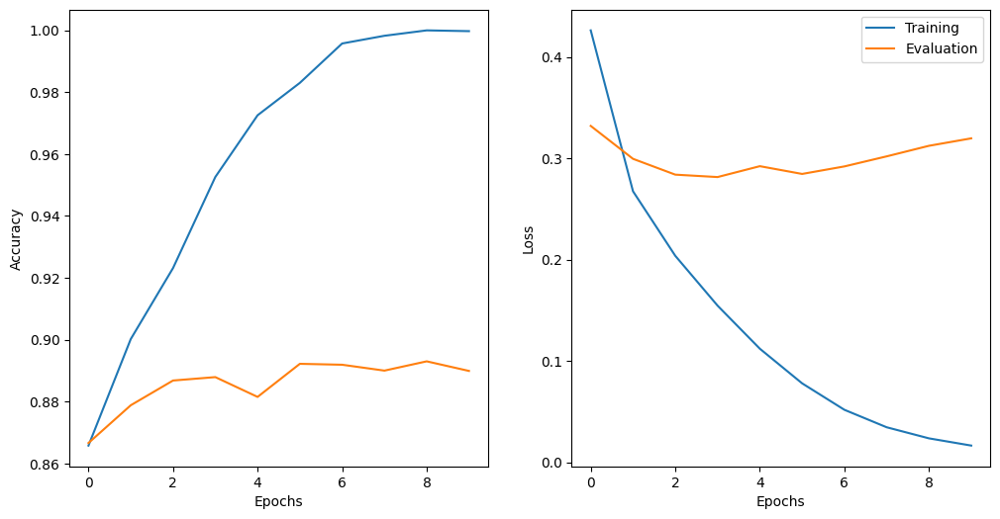

In [ ]:
import matplotlib.pyplot as plt

def plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_accs, label = "Training")
    axs[0].plot(epochs, eval_accs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("Accuracy")
    axs[1].set_ylabel("Loss")
    plt.legend()

plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses)

### Test

In [ ]:
test_dataset = prepare_dataset(test_df)
test_dataset = to_map_style_dataset(test_dataset)

In [ ]:
test_dataloader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_batch
)

In [ ]:
test_acc, test_loss = evaluate(model, criterion, test_dataloader, device)
test_acc, test_loss

(0.896, 0.2918613841639289)

### Inference

In [ ]:
torch.save(model.state_dict(), save_model + '/text_cnn_model.pt')

In [ ]:
from torchtext.data.utils import get_tokenizer

tokenizer = get_tokenizer("basic_english")

def load_model(model_path, vocab_size=10000, embedding_dim=300, num_classes=2):
    model = TextCNN(
        vocab_size=vocab_size,
        embedding_dim=embedding_dim,
        kernel_sizes=[3, 4, 5],
        num_filters=100,
        num_classes=num_classes
    )
    model.load_state_dict(torch.load(model_path, weights_only=True))
    model.eval()
    return model

def inference(sentence, vocabulary, model):
    sentence = preprocess_text(sentence)
    encoded_sentence = vocabulary(tokenizer(sentence))
    encoded_sentence = torch.tensor(encoded_sentence)
    encoded_sentence = torch.unsqueeze(encoded_sentence, 1)

    with torch.no_grad():
        predictions = model(encoded_sentence)
    preds = nn.Softmax(dim=1)(predictions)
    p_max, yhat = torch.max(preds.data, 1)
    return round(p_max.item(), 2)*100, yhat.item()

In [ ]:
model = load_model('./model/text_cnn_model.pt')
inference(test_df['preprocess_sentence'][5999], vocabulary, model)

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


(100.0, 1)